In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
import cv2
import torchvision
import torchvision.transforms as transforms
import numpy as np
import pandas as pd
from PIL import Image
from matplotlib import pyplot as plt
from skimage import color
from skimage.color import rgb2gray
from matplotlib import cm
from mpl_toolkits.mplot3d import Axes3D
from datetime import datetime
import pytz

import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Conv2D, UpSampling2D
from tensorflow.keras.utils import img_to_array, load_img
from keras.preprocessing.image import ImageDataGenerator

import tensorboard

In [ ]:
pwd = '/content/drive/MyDrive/COMP3362_Proj/'
data_dir = pwd + 'Datasets/FIDS30'
tz = pytz.timezone('Asia/Hong_Kong')
categoryTestSize = 3
validation_percent = 0.2
DIMENSION = (256, 256)
RESAMPLE = 3

# Load Data

In [ ]:
###################################
######### Load Data Paths #########
###################################
data_paths = []

for dirname, _, filenames in os.walk(data_dir):
  for filename in filenames:
    file_path = os.path.join(dirname, filename)

    label = file_path.split('/')[-2]

    if (label in ['acerolas', 'apples', 'apricots', 'avocados', 'bananas']):
      data_paths.append((file_path, label))

data_size = len(data_paths)

print('Data paths loaded!')
print('     Number of data:', data_size)
print('')



###################################
########### Load Images ###########
###################################
print('Loading images from paths...')
print('')

images = []
labels = []
test_images = dict()


for data_path, label in data_paths:
  image = np.asarray(Image.open(data_path))
  
  # Expand if only 2 in dimensions
  if (image.ndim==2):
    image = np.tile(image[:,:,None],3)
  
  # remove CMYK or RGBA image representation
  if (np.asarray(image).shape[2] != 3):
    continue
  
  # Resize Image
  image = Image.fromarray(image).resize(DIMENSION, resample=RESAMPLE)

  if (label not in test_images):
    test_images[label] = [np.asarray(image)]
  elif (len(test_images[label]) < categoryTestSize):
    test_images[label].append(np.asarray(image))
  else:
    images.append(np.asarray(image))

  labels.append(label)

images = np.asarray(images)
labels = np.asarray(labels)
for label in test_images:
  test_images[label] = np.asarray(test_images[label])

print('Images Loaded!')
print('     Shape  of training data:', images.shape)
print('     Number of test data:')
for label in test_images:
  print(f'       {label:10}: {len(test_images[label])}')

training_data_size = images.shape[0]

Data paths loaded!
     Number of data: 160

Loading images from paths...

Images Loaded!
     Shape  of training data: (142, 256, 256, 3)
     Number of test data:
       bananas   : 3
       avocados  : 3
       acerolas  : 3
       apples    : 3
       apricots  : 3


# Data Distribution

Text(0.5, 1.0, 'FIDS Dataset Distribution (5 Fruits Only)')

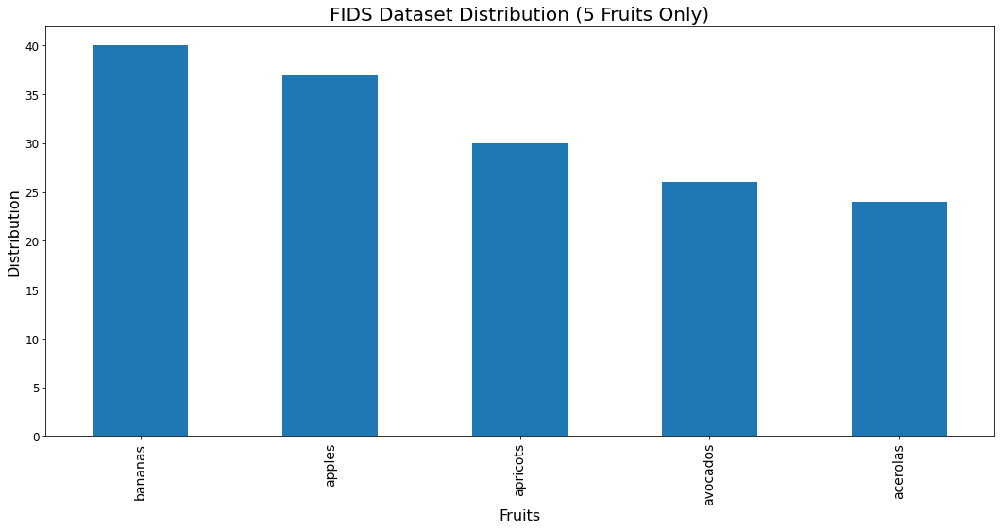

In [ ]:
image_df = pd.DataFrame(data=labels, columns=['Fruit'])

graph = image_df['Fruit'].value_counts()[:]
graph.plot(kind='bar',figsize=(18,8))
plt.xticks(rotation=90, fontsize=14)
plt.yticks(rotation=0, fontsize=12)
plt.xlabel('Fruits', fontsize=16)
plt.ylabel('Distribution', fontsize=16)
plt.title('FIDS Dataset Distribution (5 Fruits Only)', fontsize=20)

# Data Preprocessing

In [ ]:
train_augmentation = ImageDataGenerator(featurewise_center=True, rotation_range=30, zoom_range=0.3, horizontal_flip=True, rescale=1./255)

augmented_images = train_augmentation.flow(images, batch_size=1)


train_images = []
dataset_multiply = 10
i = 0
for augmented_image in augmented_images:
  image = augmented_image[0]
  train_images.append(image)

  i += 1
  if (i >= training_data_size * dataset_multiply):
    break

train_images = np.asarray(train_images)
print('Augmented data shape:', train_images.shape)

/usr/local/lib/python3.7/dist-packages/keras/preprocessing/image.py:1663: UserWarning: This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn('This ImageDataGenerator specifies '


(1420, 256, 256, 3)


In [ ]:
def showImage(imageArray, axis='on', grayscale=False):
  if (grayscale):
    plt.imshow(imageArray, cmap='gray', interpolation='nearest')
  else:
    plt.imshow(imageArray, interpolation='nearest')

  plt.axis(axis)
  plt.show()

def dataProcessing(image):
  # Change to LAB Space
  lab_res = color.rgb2lab(image)

  # Get L Space
  l_res = lab_res[:,:,0]

  # Get AB Space
  ab_res = lab_res[:,:,1:]

  return l_res, ab_res

In [ ]:
l_res_train = []
ab_res_train = []


for image in train_images:
  l_res, ab_res = dataProcessing(image)

  l_res_train.append(l_res)
  ab_res_train.append(ab_res)

# # Convert to np array with correct shape
l_res_train = np.asarray(l_res_train)
l_res_train = l_res_train.reshape(l_res_train.shape[0], l_res_train.shape[1], l_res_train.shape[2], 1)
ab_res_train = np.asarray(ab_res_train)

print('')
print("Training Shape:")
print("Training Image in L Space   :", l_res_train.shape)
print("Training Image in AB Space  :", ab_res_train.shape)


Training Shape:
Training Image in L Space   : (1420, 256, 256, 1)
Training Image in AB Space  : (1420, 256, 256, 2)


In [ ]:
rgb_res_test = dict()
gray_res_test = dict()
lab_res_test = dict()
l_res_test = dict()

test_augmentation = ImageDataGenerator(rescale=1./255)

for label in test_images:
  rgb_list = []
  gray_list = []
  lab_list = []
  l_list = []

  test_images_label = test_augmentation.flow(test_images[label], batch_size=128, shuffle=False)

  for numBatch in range(len(test_images_label)):
    for image in test_images_label[numBatch]:
      rgb_image = np.asarray(image)
      gray_image = color.rgb2gray(rgb_image)
      lab_image = color.rgb2lab(rgb_image)
      l_image = lab_image[:,:,0]

      rgb_list.append(rgb_image)
      gray_list.append(gray_image)
      lab_list.append(lab_image)
      l_list.append(l_image)
  
  rgb_res_test[label] = np.asarray(rgb_list)
  gray_res_test[label] = np.asarray(gray_list)
  lab_res_test[label] = np.asarray(lab_list)
  
  l_list = np.asarray(l_list)
  l_list = l_list.reshape(l_list.shape[0], l_list.shape[1], l_list.shape[2], 1)
  l_res_test[label] = l_list
  

print("Testing Shape (1 category):")
print("  Resized Test Image in RGB  Space   :", rgb_res_test['bananas'].shape)
print("  Resized Test Image in gray Space   :", gray_res_test['bananas'].shape)
print("  Resized Test Image in LAB  Space   :", lab_res_test['bananas'].shape)
print("  Resized Test Image in L    Space   :", l_res_test['bananas'].shape)


Testing Shape (1 category):
  Resized Test Image in RGB  Space   : (3, 256, 256, 3)
  Resized Test Image in gray Space   : (3, 256, 256)
  Resized Test Image in LAB  Space   : (3, 256, 256, 3)
  Resized Test Image in L    Space   : (3, 256, 256, 1)


# CNN Model (TF Keras)

In [ ]:
modelName = datetime.now(tz=tz).strftime("%m-%d %H:%M:%S ") + 'Model C (5 Fruits) (1000 Epochs) (0.002 lr) (Data Augmented)'

modelLogDir = pwd + 'ModelLog (Alex)/' + modelName
trainedModelDir = pwd + 'TrainedModel (Alex)/' + modelName

In [ ]:
# Model A
modelA = Sequential([
  # Encoder
  Conv2D(64, (3, 3), activation='relu', padding='same', strides=2, input_shape=(256, 256, 1)),
  Conv2D(128, (3, 3), activation='relu', padding='same'),
  Conv2D(128, (3,3), activation='relu', padding='same', strides=2),
  Conv2D(256, (3,3), activation='relu', padding='same'),
  Conv2D(256, (3,3), activation='relu', padding='same', strides=2),
  Conv2D(512, (3,3), activation='relu', padding='same'),

  # Decoder
  Conv2D(512, (3,3), activation='relu', padding='same'),
  Conv2D(256, (3,3), activation='relu', padding='same'),
  Conv2D(128, (3,3), activation='relu', padding='same'),
  UpSampling2D((2, 2)),
  Conv2D(64, (3,3), activation='relu', padding='same'),
  UpSampling2D((2, 2)),
  Conv2D(32, (3,3), activation='relu', padding='same'),
  Conv2D(16, (3,3), activation='relu', padding='same'),
  Conv2D(2, (3, 3), activation='relu', padding='same'),
  UpSampling2D((2, 2))
])

# Model B
modelB = Sequential([
  # Encoder
  Conv2D(64, (3, 3), activation='relu', padding='same', strides=2, input_shape=(256, 256, 1)),
  Conv2D(128, (3, 3), activation='relu', padding='same'),
  Conv2D(128, (3,3), activation='relu', padding='same', strides=2),
  Conv2D(256, (3,3), activation='relu', padding='same'),
  Conv2D(256, (3,3), activation='relu', padding='same', strides=2),
  Conv2D(512, (3,3), activation='relu', padding='same'),

  # Dilation layer
  Conv2D(512, (3,3), activation='relu', padding='same', dilation_rate=2),
  Conv2D(512, (3,3), activation='relu', padding='same', dilation_rate=2),
  Conv2D(512, (3,3), activation='relu', padding='same', dilation_rate=2),

  # Decoder
  Conv2D(256, (3,3), activation='relu', padding='same'),
  Conv2D(128, (3,3), activation='relu', padding='same'),
  UpSampling2D((2, 2)),
  Conv2D(64, (3,3), activation='relu', padding='same'),
  UpSampling2D((2, 2)),
  Conv2D(32, (3,3), activation='relu', padding='same'),
  Conv2D(16, (3,3), activation='relu', padding='same'),
  Conv2D(2, (3, 3), activation='relu', padding='same'),
  UpSampling2D((2, 2))
])

# Model C
modelC = Sequential([
  # Encoder
  Conv2D(64, (3, 3), activation='relu', padding='same', strides=2, input_shape=(256, 256, 1)),
  Conv2D(128, (3, 3), activation='relu', padding='same'),
  Conv2D(128, (3,3), activation='relu', padding='same', strides=2),
  Conv2D(256, (3,3), activation='relu', padding='same'),
  Conv2D(256, (3,3), activation='relu', padding='same', strides=2),
  Conv2D(512, (3,3), activation='relu', padding='same'),

  # Dilation layer
  Conv2D(512, (3,3), activation='relu', padding='same', dilation_rate=2),
  Conv2D(512, (3,3), activation='relu', padding='same', dilation_rate=2),
  Conv2D(512, (3,3), activation='relu', padding='same', dilation_rate=2),
  Conv2D(512, (3,3), activation='relu', padding='same', dilation_rate=2),

  # Decoder
  Conv2D(512, (3,3), activation='relu', padding='same'),
  Conv2D(256, (3,3), activation='relu', padding='same'),
  UpSampling2D((2, 2)),
  Conv2D(128, (3,3), activation='relu', padding='same'),
  Conv2D(64, (3,3), activation='relu', padding='same'),
  UpSampling2D((2, 2)),
  Conv2D(32, (3,3), activation='relu', padding='same'),
  Conv2D(16, (3,3), activation='relu', padding='same'),
  Conv2D(2, (3, 3), activation='relu', padding='same'),
  UpSampling2D((2, 2))
])

In [ ]:
# def classRebalancingLoss(y_actual,y_pred):
#     loss = np.dot(y_actual, np.sum(np.dot(y_actual, np.log(y_pred)), axis=2))
#     leftPart = y_actual
#     return loss

In [ ]:
model = modelC

learning_rate = 0.002
decay = 0.9

optimizer= tf.keras.optimizers.Adam(learning_rate=learning_rate, decay=decay, clipnorm=1.0)

model.compile(optimizer=optimizer, loss='mse', metrics=['accuracy'])
model.summary()

tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=modelLogDir)

Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_163 (Conv2D)         (None, 128, 128, 64)      640       
                                                                 
 conv2d_164 (Conv2D)         (None, 128, 128, 128)     73856     
                                                                 
 conv2d_165 (Conv2D)         (None, 64, 64, 128)       147584    
                                                                 
 conv2d_166 (Conv2D)         (None, 64, 64, 256)       295168    
                                                                 
 conv2d_167 (Conv2D)         (None, 32, 32, 256)       590080    
                                                                 
 conv2d_168 (Conv2D)         (None, 32, 32, 512)       1180160   
                                                                 
 conv2d_169 (Conv2D)         (None, 32, 32, 512)     

In [ ]:
history = model.fit(x=l_res_train, y=ab_res_train, validation_split=0.2, epochs=1000, batch_size=128, callbacks=[tensorboard_callback], shuffle=True)

model.save(trainedModelDir)

print('\nWAIT! Saving Model...')

print('\nTraining Finished')
print('   Model Log saved in      :', modelLogDir)
print('   Trained Model saved in  :', trainedModelDir)

# Evaluation

Number of labels: 5
1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 3070 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


1/1 [==============================] - 0s 20ms/step


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 33 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 19ms/step


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 1279 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


1/1 [==============================] - 0s 19ms/step


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 441 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


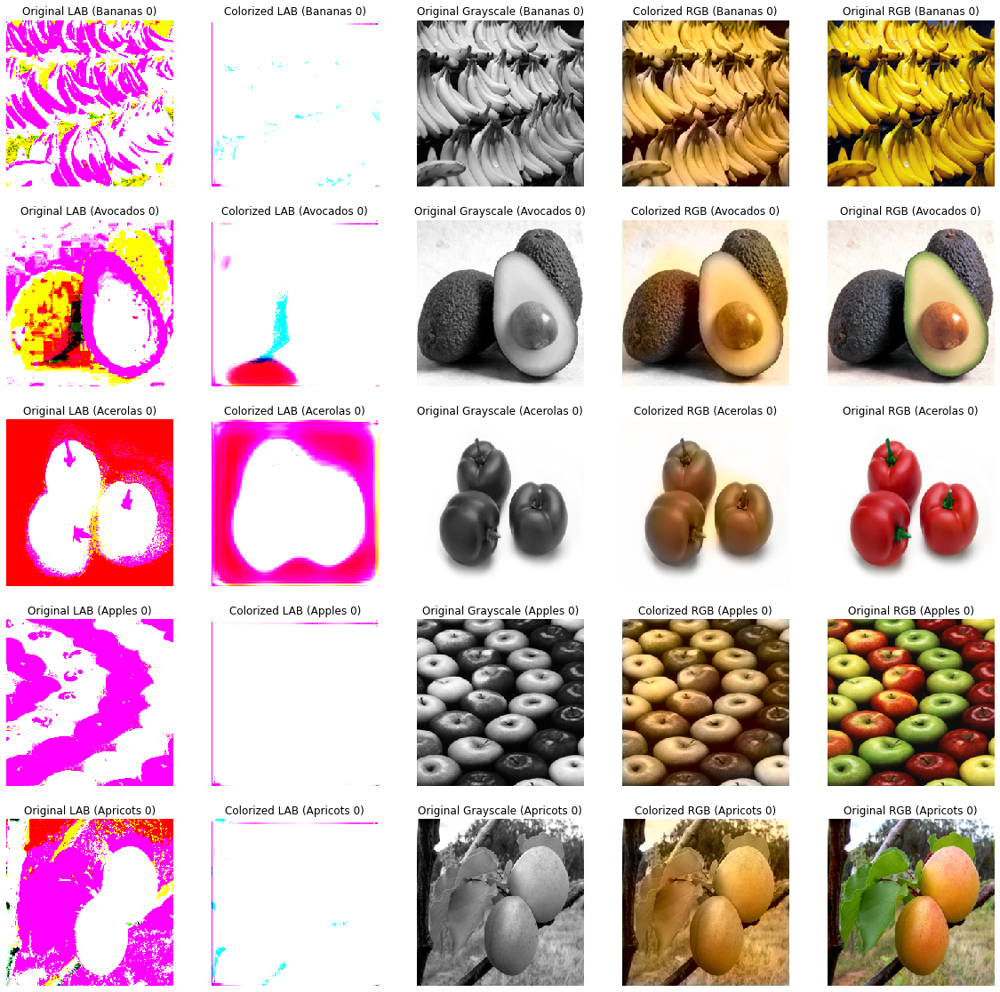

In [ ]:
dataStart = 0
numOfData = 1
max_size = 1000


plt.figure(figsize=(20,20))

size = len(rgb_res_test) * numOfData
print("Number of labels:", size)

count = 0
for i in range(dataStart, dataStart + numOfData):
  for label in rgb_res_test:
    # Use the Model
    test_image = l_res_test[label][i:i+1]
    model_output = model.predict(test_image)

    output_image_l = test_image[0]
    output_image_ab = model_output[0]
    output_image_lab = np.concatenate((output_image_l, output_image_ab),axis=2)
    output_image_rgb = color.lab2rgb(output_image_lab)

    lab_image = lab_res_test[label][i]
    gray_image = gray_res_test[label][i]
    rgb_image = rgb_res_test[label][i]

    plt.subplot(size, 5, count*5+1)
    plt.imshow(lab_image, interpolation='nearest')
    plt.axis('off')
    plt.title('Original LAB (' + label.capitalize() + ' ' + str(i) + ')')

    plt.subplot(size, 5, count*5+2)
    plt.imshow(output_image_lab, interpolation='nearest')
    plt.axis('off')
    plt.title('Colorized LAB (' + label.capitalize() + ' ' + str(i) + ')')

    plt.subplot(size, 5, count*5+3)
    plt.imshow(gray_image, interpolation='nearest', cmap='gray')
    plt.axis('off')
    plt.title('Original Grayscale (' + label.capitalize() + ' ' + str(i) + ')')

    plt.subplot(size, 5, count*5+4)
    plt.imshow(output_image_rgb, interpolation='nearest')
    plt.axis('off')
    plt.title('Colorized RGB (' + label.capitalize() + ' ' + str(i) + ')')

    plt.subplot(size, 5, count*5+5)
    plt.imshow(rgb_image, interpolation='nearest')
    plt.axis('off')
    plt.title('Original RGB (' + label.capitalize() + ' ' + str(i) + ')')

    count += 1
    if (count == max_size):
      break
  if (count == max_size):
    break

plt.show()

1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 122 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


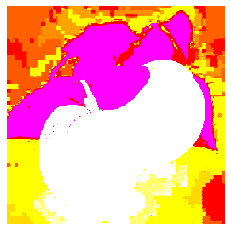

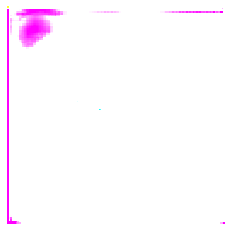

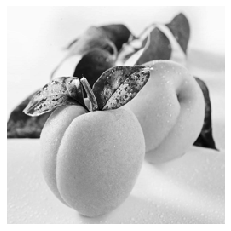

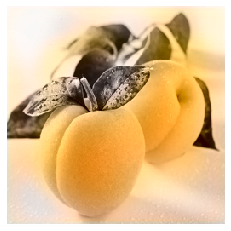

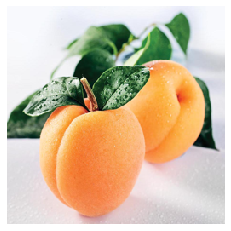

In [ ]:
# Use the Model
i = 1
label = 'apricots'

test_image = l_res_test[label][i:i+1]
model_output = model.predict(test_image)

output_image_l = test_image[0]
output_image_ab = model_output[0]
output_image_lab = np.concatenate((output_image_l, output_image_ab),axis=2)
output_image_rgb = color.lab2rgb(output_image_lab)

lab_image = lab_res_test[label][i]
gray_image = gray_res_test[label][i]
rgb_image = rgb_res_test[label][i]

showImage(lab_image, axis='off')
showImage(output_image_lab, axis='off')
showImage(gray_image, axis='off', grayscale=True)
showImage(output_image_rgb, axis='off')
showImage(rgb_image, axis='off')

1/1 [==============================] - 0s 24ms/step


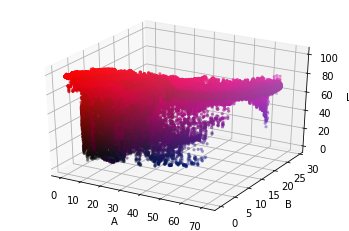

In [ ]:
i = 1
label = 'apricots'

test_image = l_res_test[label][i:i+1]
model_output = model.predict(test_image)

output_image_l = test_image[0]
output_image_ab = model_output[0]
output_image_lab = np.concatenate((output_image_l, output_image_ab),axis=2)
output_image_rgb = color.lab2rgb(output_image_lab)


lab_image = lab_res_test[label][i]
gray_image = gray_res_test[label][i]
rgb_image = rgb_res_test[label][i]

y,x,z = output_image_lab.shape
LAB_flat = np.reshape(output_image_lab, [y*x,z])
colors = np.reshape(output_image_lab, [y*x,z])/100.

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(xs=LAB_flat[:,2], ys=LAB_flat[:,1], zs=LAB_flat[:,0], s=10,  c=colors, lw=0)
ax.set_xlabel('A')
ax.set_ylabel('B')
ax.set_zlabel('L')

plt.show()

In [ ]:
import numpy as np
import skimage
from skimage import metrics
import math
from skimage import color, filters
import math

In [ ]:



def rmetrics(a, b):

    # pnsr
    mse = np.mean((a-b)**2)
    psnr = 10*math.log10(1/mse)

    # ssim
    ssim = metrics.structural_similarity(a, b, multichannel=True)

    return psnr, ssim


def nmetrics(a):
    rgb = a
    lab = color.rgb2lab(a)
    gray = color.rgb2gray(a)
    # UCIQE
    c1 = 0.4680
    c2 = 0.2745
    c3 = 0.2576
    l = lab[:, :, 0]

    # 1st term
    chroma = (lab[:, :, 1]**2 + lab[:, :, 2]**2)**0.5
    uc = np.mean(chroma)
    sc = (np.mean((chroma - uc)**2))**0.5

    # 2nd term
    top = int(np.round(0.01*l.shape[0]*l.shape[1]))
    sl = np.sort(l, axis=None)
    isl = sl[::-1]
    conl = np.mean(isl[:top])-np.mean(sl[:top])

    # 3rd term
    satur = []
    chroma1 = chroma.flatten()
    l1 = l.flatten()
    for i in range(len(l1)):
        if chroma1[i] == 0:
            satur.append(0)
        elif l1[i] == 0:
            satur.append(0)
        else:
            satur.append(chroma1[i] / l1[i])

    us = np.mean(satur)

    uciqe = c1 * sc + c2 * conl + c3 * us

    # UIQM
    p1 = 0.0282
    p2 = 0.2953
    p3 = 3.5753

    # 1st term UICM
    rg = rgb[:, :, 0] - rgb[:, :, 1]
    yb = (rgb[:, :, 0] + rgb[:, :, 1]) / 2 - rgb[:, :, 2]
    rgl = np.sort(rg, axis=None)
    ybl = np.sort(yb, axis=None)
    al1 = 0.1
    al2 = 0.1
    T1 = int(al1 * len(rgl))
    T2 = int(al2 * len(rgl))
    rgl_tr = rgl[T1:-T2]
    ybl_tr = ybl[T1:-T2]

    urg = np.mean(rgl_tr)
    s2rg = np.mean((rgl_tr - urg) ** 2)
    uyb = np.mean(ybl_tr)
    s2yb = np.mean((ybl_tr - uyb) ** 2)

    uicm = -0.0268 * np.sqrt(urg**2 + uyb**2) + 0.1586 * np.sqrt(s2rg + s2yb)

    # 2nd term UISM (k1k2=8x8)
    Rsobel = rgb[:, :, 0] * filters.sobel(rgb[:, :, 0])
    Gsobel = rgb[:, :, 1] * filters.sobel(rgb[:, :, 1])
    Bsobel = rgb[:, :, 2] * filters.sobel(rgb[:, :, 2])

    Rsobel = np.round(Rsobel).astype(np.uint8)
    Gsobel = np.round(Gsobel).astype(np.uint8)
    Bsobel = np.round(Bsobel).astype(np.uint8)

    Reme = eme(Rsobel)
    Geme = eme(Gsobel)
    Beme = eme(Bsobel)

    uism = 0.299 * Reme + 0.587 * Geme + 0.114 * Beme

    # 3rd term UIConM
    uiconm = logamee(gray)

    uiqm = p1 * uicm + p2 * uism + p3 * uiconm
    return uiqm, uciqe


def eme(ch, blocksize=8):

    num_x = math.ceil(ch.shape[0] / blocksize)
    num_y = math.ceil(ch.shape[1] / blocksize)

    eme = 0
    w = 2. / (num_x * num_y)
    for i in range(num_x):

        xlb = i * blocksize
        if i < num_x - 1:
            xrb = (i+1) * blocksize
        else:
            xrb = ch.shape[0]

        for j in range(num_y):

            ylb = j * blocksize
            if j < num_y - 1:
                yrb = (j+1) * blocksize
            else:
                yrb = ch.shape[1]

            block = ch[xlb:xrb, ylb:yrb]

            blockmin = float(np.min(block))
            blockmax = float(np.max(block))

            # # old version
            # if blockmin == 0.0: eme += 0
            # elif blockmax == 0.0: eme += 0
            # else: eme += w * math.log(blockmax / blockmin)

            # new version
            if blockmin == 0:
                blockmin += 1
            if blockmax == 0:
                blockmax += 1
            eme += w * math.log(blockmax / blockmin)
    return eme


def plipsum(i, j, gamma=1026):
    return i + j - i * j / gamma


def plipsub(i, j, k=1026):
    return k * (i - j) / (k - j)


def plipmult(c, j, gamma=1026):
    return gamma - gamma * (1 - j / gamma)**c


def logamee(ch, blocksize=8):

    num_x = math.ceil(ch.shape[0] / blocksize)
    num_y = math.ceil(ch.shape[1] / blocksize)

    s = 0
    w = 1. / (num_x * num_y)
    for i in range(num_x):

        xlb = i * blocksize
        if i < num_x - 1:
            xrb = (i+1) * blocksize
        else:
            xrb = ch.shape[0]

        for j in range(num_y):

            ylb = j * blocksize
            if j < num_y - 1:
                yrb = (j+1) * blocksize
            else:
                yrb = ch.shape[1]

            block = ch[xlb:xrb, ylb:yrb]
            blockmin = float(np.min(block))
            blockmax = float(np.max(block))

            top = plipsub(blockmax, blockmin)
            bottom = plipsum(blockmax, blockmin)

            m = top/bottom
            if m == 0.:
                s += 0
            else:
                s += (m) * np.log(m)

    return plipmult(w, s)


def evaluate(result, reference):
    psnr, ssim = rmetrics(result, reference)
    uiqm, uciqe = nmetrics(result)
    print(f"------PSNR = {psnr}, SSIM = {ssim}, UIQM = {uiqm}, UCIQE = {uciqe}------")
    return psnr, ssim, uiqm, uciqe



In [ ]:
# PSNR -> Compare, Smaller better
# SSIM -> Compare, (-1 to 1) --> either flip or absolute
# UIQM -> Self Evaluation
# UCIQE -> Self Evaluation
a = evaluate(output_image_rgb, rgb_image)

------PSNR = 18.954907898065013, SSIM = 0.9225369605642432, UIQM = -0.5523472877062586, UCIQE = 34.98717540234193------


dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


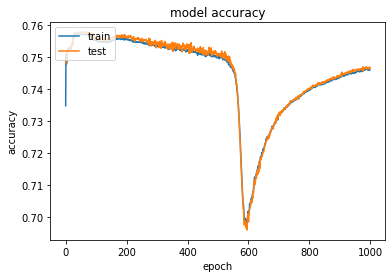

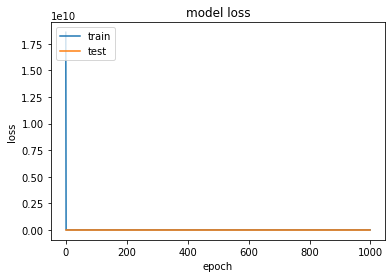

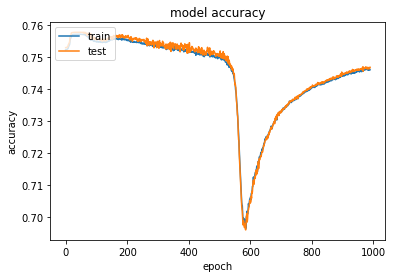

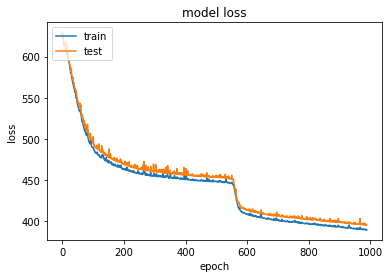

In [ ]:
# list all data in history
print(history.history.keys())
# summarize history for accuracy
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

# summarize history for accuracy
plt.plot(history.history['accuracy'][10:])
plt.plot(history.history['val_accuracy'][10:])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'][10:])
plt.plot(history.history['val_loss'][10:])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

# TensorBoard

In [ ]:
%load_ext tensorboard
%tensorboard --logdir '/content/drive/MyDrive/COMP3362_Proj/ModelLog (Alex)/'

Output hidden; open in https://colab.research.google.com to view.

# Load Model

1/1 [==============================] - 0s 113ms/step


(256, 256, 3)


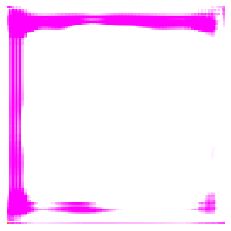

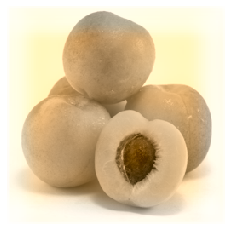

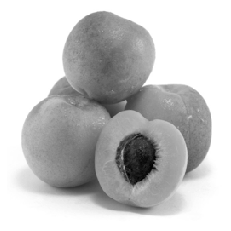

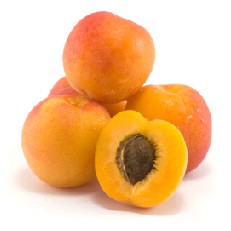

In [ ]:
modelToLoad = pwd + 'TrainedModel (Alex)/' + '11-03 20:20:41 Baseline Model 1 (5 Fruits)'

new_model = tf.keras.models.load_model(modelToLoad)

# Use the Model
i = 2
label = 'bananas'

test_image = l_res_test[label][i:i+1]
model_output = model.predict(test_image)

output_image_l = test_image[0]
output_image_ab = model_output[0]
output_image_lab = np.concatenate((output_image_l, output_image_ab),axis=2)
output_image_rgb = color.lab2rgb(output_image_lab)

lab_image = lab_res_test[label][i]
gray_image = gray_res_test[label][i]
rgb_image = rgb_res_test[label][i]

showImage(lab_image, axis='off')
showImage(output_image_lab, axis='off')
showImage(gray_image, axis='off', grayscale=True)
showImage(output_image_rgb, axis='off')
showImage(rgb_image, axis='off')